In [21]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib as mpl
import matplotlib.patches as mpatches

import glob 
import os
import h5py
import pickle

from mpl_toolkits.axes_grid1 import make_axes_locatable
from itertools import compress, product
from numpy import save
from numpy.random import seed
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from keras.utils import np_utils
from csv import reader
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping


from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dropout, Flatten, Dense
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tqdm import tqdm 

# To be changed!
sep = os.path.sep
os.environ['PROJ_LIB'] = "C:" + sep + "Users" + sep + "dario" + sep + "anaconda3" + sep + "Library" + sep + "share"
from mpl_toolkits.basemap import Basemap


In [40]:
import tqdm
print(tqdm.__version__)

# import os
# import h5py
# import pickle

4.62.3


# Function definition

In [2]:
def create_database_for_final_map(rangeX, rangeY):
    
    from shapely.geometry import Point
    from tqdm import tqdm 

    pixels_in_map = []
    item = 0
    for i in tqdm(rangeX): #range(lon.shape[0]):
        for j in rangeY: #range(lon.shape[1]):
            p = Point(lon[i,j],lat[i,j])
            pixels_in_map.append({'id':item,'CLASS_ID':np.random.randint(5),'CLASS_NAME':'unknown','pixels':[np.flipud(DATA_CUBE[i,:,j].T)]})
            item += 1
            
    return pixels_in_map

def prepare_map_as_tuple(input_data):

    data = [] 
    labels = []
    
    for element in input_data:
        for row in element['pixels']:
            data.append(np.array(row).reshape(len(row),1))
            labels.append(element['CLASS_ID'])

    data = np.array(data)
    labels = np.array(labels)

    return (data,labels)

def model_1D(dim, learn_rate, lmbda, drop, FL, n_filters, init):
    """Parameters:

    dim : image dimension (256)
    learn_rate : learning rate for the optimizer (1e-4)
    lmbda : regularization parameter (1e-5)
    drop : dropout percentage (0.15)
    FL : kernel size (3)
    n_filters: number of filters (112)
    init: kernel initializer (he_normal)

    Output:

    model : unet model"""

    img_input = tf.keras.Input(shape=(dim, 1))

    C1 = Conv1D(n_filters, FL, padding='same', activation='relu', kernel_initializer=init,
                kernel_regularizer=l2(lmbda))(img_input)
    MP1 = MaxPooling1D(pool_size=(2), strides=(2))(C1)

    F = Flatten()(MP1)
    D1 = Dense(units=128, activation='relu')(F)
    D2 = Dense(units=5, activation='softmax')(D1)

    model = Model(inputs=img_input, outputs=D2)

    opt = Adam(learning_rate=learn_rate)
    model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

    return model

def eval_classes_and_points(input_file, keep_saturation):
    n_points = []
    classes = []
    with open(input_file, 'r') as read_obj:
        # pass the file object to reader() to get the reader object
        csv_reader = reader(read_obj)
        # Iterate over each row in the csv using reader object
        for num, row in enumerate(csv_reader):
            # row variable is a list that represents a row in csv
            if row[0][0] != ';':
                break
            if 'npts' in row[0]:
                n_points.append(int(row[0].split(':')[1]))
                #print(n_points)
            if 'name' in row[0]:
                if 'class0' in row[0].split(':')[1].lower():
                    if 'saturi' in row[0].split(':')[1].lower():
                        if keep_saturation:
                            classes.append(-1)
                        else:
                            classes.append(0)
                    else:
                        classes.append(0)
                elif 'class1' in row[0].split(':')[1].lower():
                    classes.append(1)
                elif 'class2' in row[0].split(':')[1].lower():
                    classes.append(2)
                elif 'class3' in row[0].split(':')[1].lower():
                    classes.append(3)
                elif 'class4' in row[0].split(':')[1].lower():
                    classes.append(4)
                #print(classes)
        skip_rows = num
        
    return classes, n_points, skip_rows


def get_classes_array(classes, points):
    classes_array = []
    for i in range(len(classes)):
        classes_array = classes_array + list(np.repeat(classes[i], points[i]))
    
    return classes_array


def select_train_test_per_class(data, num, test_size, unique):
    df_class0 = data[data['class'] == unique[num]]
    class_test_ = df_class0.sample(n=int(test_size[num]))
    class_train_ = df_class0[df_class0.index.isin(list(set(df_class0.index) - set(class_test_.index)))]
    return class_train_, class_test_


def get_items_and_labels(data):
    x = data.filter(regex='B')
    if (data.filter(regex='class').min().values[0]) == -1:
        y = data.filter(regex='class') + 1
    else:
        y = data.filter(regex='class')
    y_cat = np_utils.to_categorical(y)
    return x, y, y_cat

def train_test_split(Training_dataset):
    
    (unique, counts) = np.unique(Training_dataset['class'].values, return_counts=True)
    test_size = np.round(0.3*counts)

    train = pd.DataFrame()
    test = pd.DataFrame()
    for i in range(len(unique)):
        class_train, class_test = select_train_test_per_class(Training_dataset, i, test_size, unique)
        train = train.append(class_train, ignore_index=True)
        test = test.append(class_test, ignore_index=True)

    return train, test


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=14)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize = 14)
    plt.yticks(tick_marks, classes, fontsize = 14)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in product(range(cm.shape[0]),   range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), fontsize = 16,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize = 16)
    plt.xlabel('Predicted label', fontsize = 16)

# <font color='blue'>Opening the PRISMA image</font> 

According to the ASI policy, the image used in this tutorial should be downloaded by the user, searching for
the product:

PRS_L2D_STD_20191227000827_20191227000831_0001

located in Australia, New South Wales, acquired on December 27, 2019.

### Extracting and exploring the whole set of data

In [3]:
# PUT HERE YOUR FOLDER WITH THE 2D LEVEL!

folder = 'D:\\Documenti_Lavoro\\ASI-ESA POSTDOC\\PRISMA\\fire\\PRS - Australia with fire\\Nuovo_Processore\\PRS_L2D_STD_20191227000827_20191227000831_0001\\PRS_L2D_STD_20191227000827_20191227000831_0001.he5'
f = h5py.File(folder,'r')

# Displaying the content of the PRISMA image
f.visit(print)

HDFEOS
HDFEOS/SWATHS
HDFEOS/SWATHS/Geocoding attributes
HDFEOS/SWATHS/Geocoding attributes/Ancillary
HDFEOS/SWATHS/PRS_L2D_HCO
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/SWIR_Cube
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/SWIR_PIXEL_L2_ERR_MATRIX
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/VNIR_Cube
HDFEOS/SWATHS/PRS_L2D_HCO/Data Fields/VNIR_PIXEL_L2_ERR_MATRIX
HDFEOS/SWATHS/PRS_L2D_HCO/Geocoding Model
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Latitude
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Longitude
HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Time
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Observing_Angle
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Rel_Azimuth_Angle
HDFEOS/SWATHS/PRS_L2D_HCO/Geometric Fields/Solar_Zenith_Angle
HDFEOS/SWATHS/PRS_L2D_PCO
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fields
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fields/Cube
HDFEOS/SWATHS/PRS_L2D_PCO/Data Fiel

### Displaying the attributes of the PRISMA image

In [4]:
keys_attr = f.attrs.keys()

for attr in keys_attr:
    print(attr)

Acquisition_Purpose
Acquisition_Size
Acquisition_Station
Acquisition_Type
Atm_LutGeomInfo_RelativeAzimuth
Atm_LutGeomInfo_SunZenith
Atm_LutGeomInfo_ViewZenith
Atm_Lut_version
Atmo_RTM_info
Atmo_profile_info
Aux_SunEarthDistance
Aux_SunIrradiance
CNM_L2_BINNING
CNM_L2_BIN_ON
CNM_L2_BSEL_ON
CNM_L2_HGRP
CNM_PAN_ACQ
CNM_SWIR_ACQ
CNM_SWIR_SELECT
CNM_VNIR_ACQ
CNM_VNIR_SELECT
Cloudy_pixels_percentage
DEM_info
Epsg_Code
Exit_Code
Frame_Type
GCP_info
ISF_ID_Start
Image_ID
Integration_Time
L1_Processor_Version
L1_Quality_CCPerc
L2ScalePanMax
L2ScalePanMin
L2ScaleSwirMax
L2ScaleSwirMin
L2ScaleVnirMax
L2ScaleVnirMin
L2d_Quality_flags
List_Cw_Swir
List_Cw_Swir_Flags
List_Cw_Vnir
List_Cw_Vnir_Flags
List_Fwhm_Swir
List_Fwhm_Vnir
Main_Electornic_Unit
Map_AOT_accuracy
Map_WV_accuracy
Num_Frames
Number_of_ISF
PANCorruptedFrameList
PAN_ACQ
PAN_Corrupted_Frame_Percentage
PAN_HGRP
PAN_HYP_ACT_RESIDUAL_m
PAN_HYP_ALT_RESIDUAL_m
PAN_HYP_START_SYNC_FRAME
PAN_HYP_START_SYNC_SUBFRAME
PAN_HYP_STOP_SYNC_FRAME
PAN_

## 1. Extracting the DATA Cube

In [5]:
# SWIR Channel SWIR: 920 – 2505 nm
SWIR = f.attrs['L2ScaleSwirMin'] + f['HDFEOS']['SWATHS'][f'PRS_L2D_HCO']['Data Fields']['SWIR_Cube']*(f.attrs['L2ScaleSwirMax']-f.attrs['L2ScaleSwirMin'])/(2**16-1)
# VNIR Channel VNIR: 400 – 1010 nm 
VNIR = f.attrs['L2ScaleVnirMin'] + f['HDFEOS']['SWATHS'][f'PRS_L2D_HCO']['Data Fields']['VNIR_Cube']*(f.attrs['L2ScaleVnirMax']-f.attrs['L2ScaleVnirMin'])/(2**16-1)

# VNIR and SWIR Datacubes
VNIR_array = VNIR[()][:,3:,:] # deleting the all-zero elements
SWIR_array = SWIR[()][:,:-2,:]

# Wavelengths
SWIR_CW = f.attrs.get('List_Cw_Swir')[:-2]
VNIR_CW = f.attrs.get('List_Cw_Vnir')[3:]
WL = np.append(SWIR_CW[:-2],VNIR_CW[2:])
    
lat = f[f'HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Latitude'][:]
lon = f[f'HDFEOS/SWATHS/PRS_L2D_HCO/Geolocation Fields/Longitude'][:]


# Creating the RGB composite image

red = VNIR_array[:,35,:] # 36=632.13165 nm, 35=641.33325 nm
green = VNIR_array[:,45,:] # 48=530.66705 nm, 45=554.5646 nm
blue = VNIR_array[:,57,:] # 463.731 nm
IM = np.array([red,green,blue])#.reshape(1181,1203,3)
w,h = IM.shape[1],IM.shape[2]
print('Dimensions of the image:', w,h)
IM = IM.reshape(3,w,h)
print('Dimensions of the pre-processed RGB image:',IM.shape)

t=(w,h,3)
#A=np.zeros(t,dtype=np.uint16)
A=np.zeros(t)
for i in range(w):
    for j in range(h):
        A[i,j]=[red[i,j],green[i,j],blue[i,j]]
print('Dimensions of the post-processed RGB image:',A.shape)

# Array containing both SWIR and VNIR
# I delete the overlapping between SWIR and VNIR, mantaining only the VNIR given the better SNR
DATA_CUBE = np.concatenate((SWIR_array[:,:-4,:], VNIR_array[:,:,:]), axis=1) 

Dimensions of the image: 1181 1203
Dimensions of the pre-processed RGB image: (3, 1181, 1203)
Dimensions of the post-processed RGB image: (1181, 1203, 3)


## Showing the RGB composite

C:\Users\dario\anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


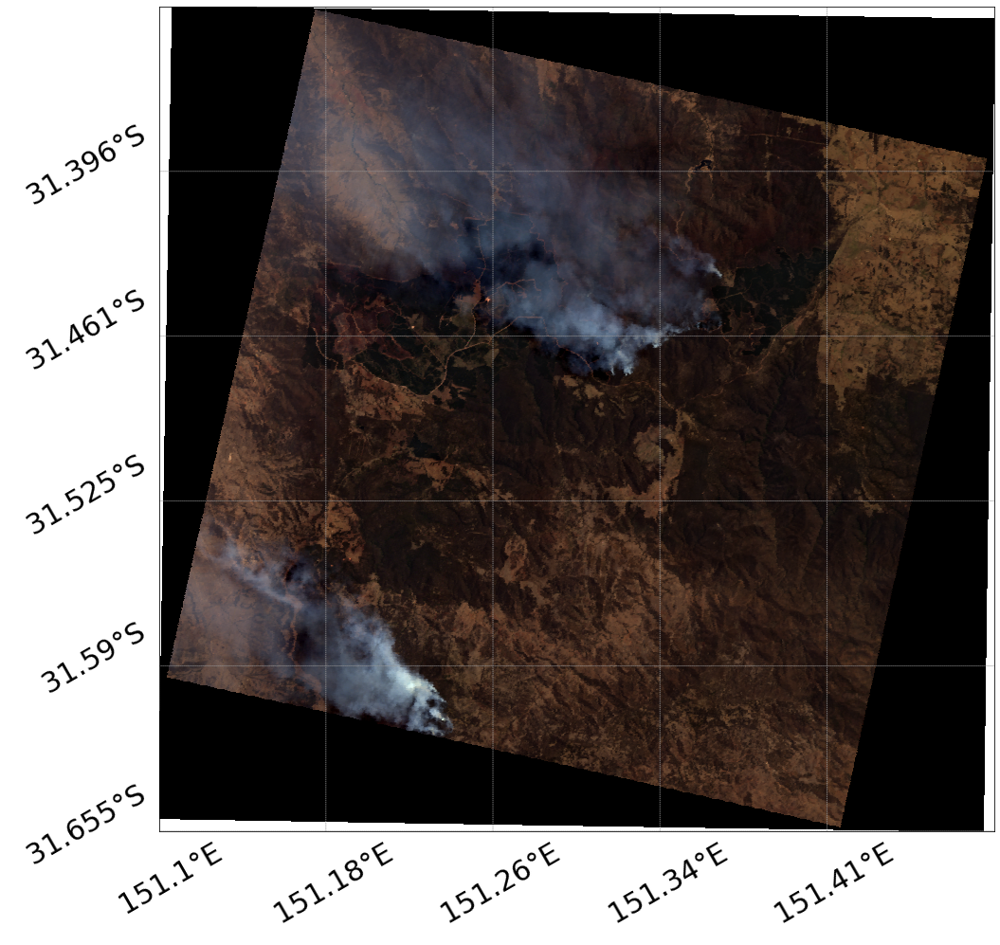

In [6]:
# initialize the figure
fig,ax = plt.subplots(figsize = (16,16))

# Define lats and longs for the figure
lons_fig = [np.min(lon), np.max(lon)]
lats_fig = [np.min(lat), np.max(lat)]
# lons_fig = [151.2, 151.26]
# lats_fig = [-31.629,-31.590]
lat_0 = np.mean(lats_fig)
lon_0 = np.mean(lons_fig)

# initialize the map
map_kwargs = dict(projection='merc', resolution='l',
                  llcrnrlat=np.min(lats_fig), urcrnrlat=np.max(lats_fig),
                  llcrnrlon=np.min(lons_fig), urcrnrlon=np.max(lons_fig),
                  lat_0=lat_0, lon_0=lon_0)
m = Basemap(**map_kwargs)

# drawing parallels and meridians
m.drawparallels(np.arange(np.min(lats_fig),np.max(lats_fig),0.2*(np.max(lats_fig)-np.min(lats_fig))),labels=[1,0,0,0],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')
m.drawmeridians(np.arange(np.min(lons_fig),np.max(lons_fig),0.2*(np.max(lons_fig)-np.min(lons_fig))),labels=[0,0,0,1],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')


# drawing the PRISMA image
mesh_rgb = A[:, :-1, :]/np.max(A)  # also A[:, 1:, :] works fine
colorTuple = mesh_rgb.reshape((mesh_rgb.shape[0] * mesh_rgb.shape[1]), 3)
alpha = 1.0
colorTuple = np.insert(colorTuple,3,alpha,axis=1)

## What you put in for the image doesn't matter because of the color mapping
m.pcolormesh(lon, lat, A[:,:,0], latlon=True, color=colorTuple)

# Labels on axes
#plt.xlabel('Longitude (degree)', labelpad=80, fontsize=16)
#plt.ylabel('Latitude (degree)', labelpad=100, fontsize=16)

plt.show()


This is what you should see!

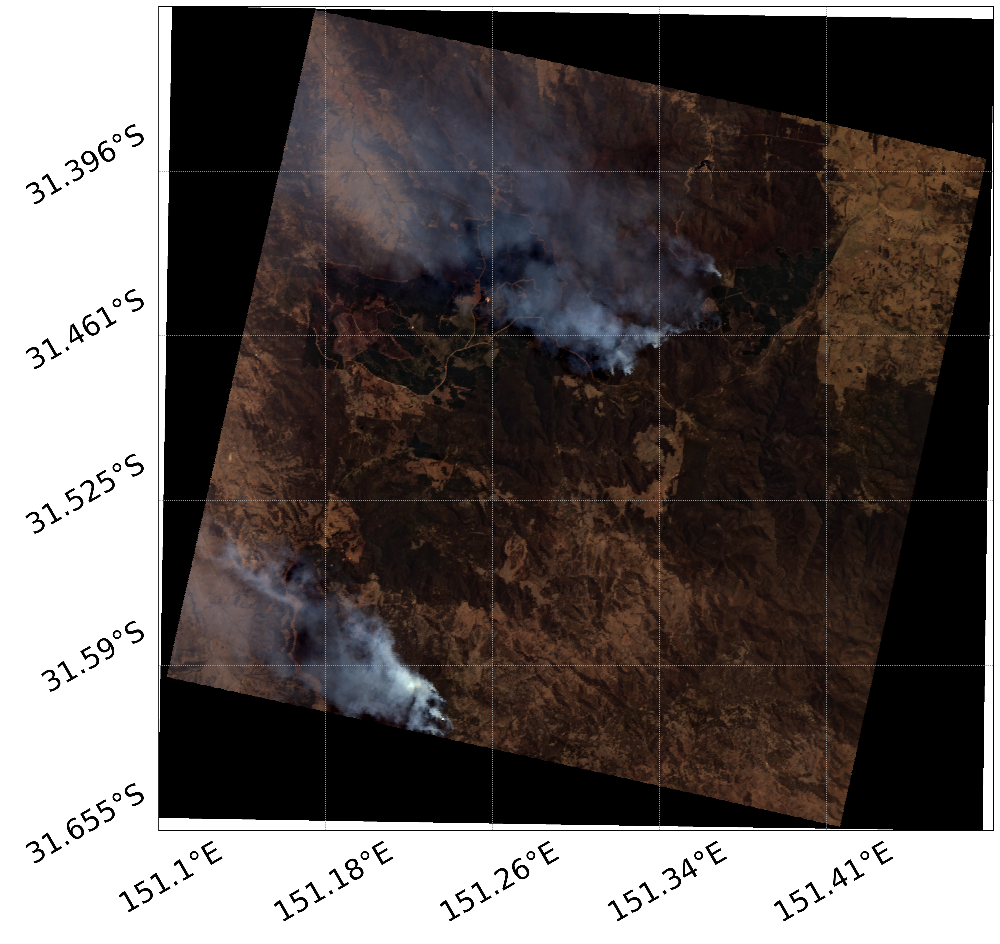

## Showing the SWIR information

C:\Users\dario\anaconda3\lib\site-packages\ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


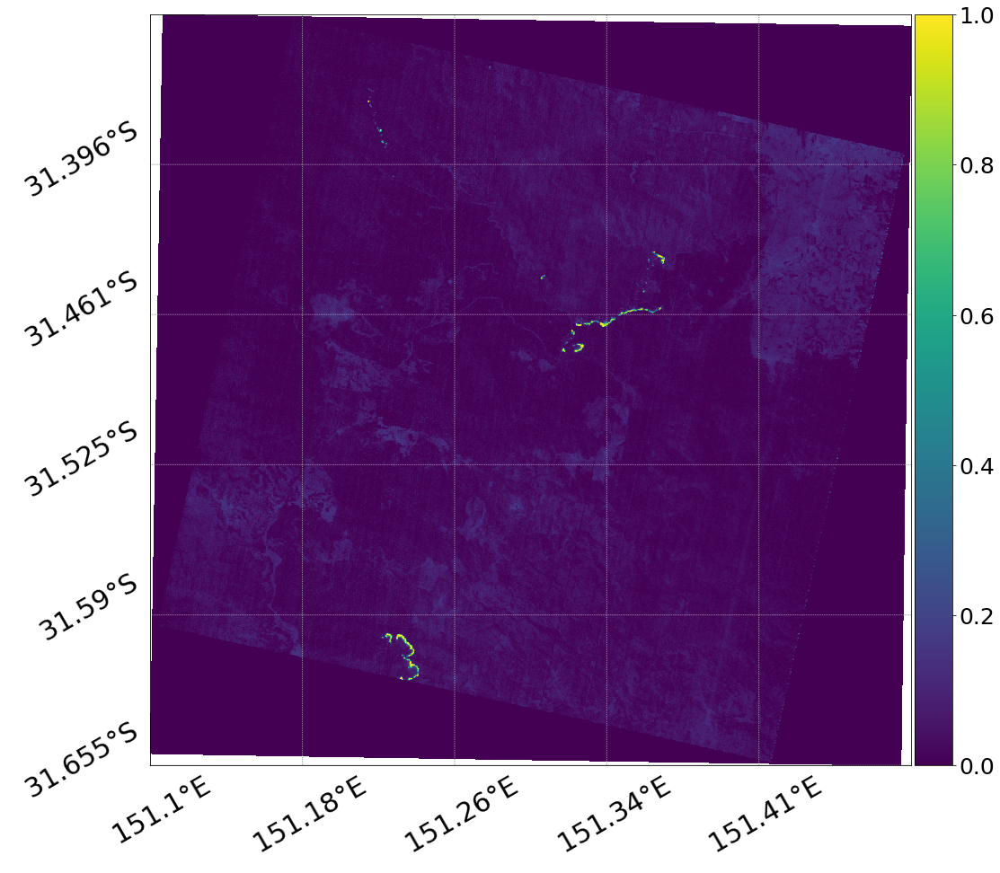

In [7]:
# initialize the figure
fig,ax = plt.subplots(figsize = (16,16))

# Define lats and longs for the figure
lons_fig = [np.min(lon), np.max(lon)]
lats_fig = [np.min(lat), np.max(lat)]
#lons_fig = [151.2, 151.26]
#lats_fig = [-31.629,-31.590]
lat_0 = np.mean(lats_fig)
lon_0 = np.mean(lons_fig)

# initialize the map
map_kwargs = dict(projection='merc', resolution='l',
                  llcrnrlat=np.min(lats_fig), urcrnrlat=np.max(lats_fig),
                  llcrnrlon=np.min(lons_fig), urcrnrlon=np.max(lons_fig),
                  lat_0=lat_0, lon_0=lon_0)
m = Basemap(**map_kwargs)

# drawing parallels and meridians
m.drawparallels(np.arange(np.min(lats_fig),np.max(lats_fig),0.2*(np.max(lats_fig)-np.min(lats_fig))),labels=[1,0,0,0],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')
m.drawmeridians(np.arange(np.min(lons_fig),np.max(lons_fig),0.2*(np.max(lons_fig)-np.min(lons_fig))),labels=[0,0,0,1],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')

## What you put in for the image doesn't matter because of the color mapping
m.pcolormesh(lon, lat, SWIR_array[:,0,:], latlon=True) #/(2**16-1)
#m.pcolormesh(lon[550:650,550:650], lat[550:650,550:650], SWIR_array[550:650,1,550:650]/(2**16-1), latlon=True)

    
# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

cb = plt.colorbar(cax=cax)
cb.ax.tick_params(labelsize=25)

# Labels on axes
#plt.xlabel('Longitude (degree)', labelpad=80, fontsize=16)
#plt.ylabel('Latitude (degree)', labelpad=100, fontsize=16)

# Showing image
#plt.savefig(f'D:\\Documenti_Lavoro\\ASI-ESA POSTDOC\\PRISMA\\fire\\Swir_2D.png',dpi=300,bbox_inches='tight')
#plt.show()


This is what you should see!

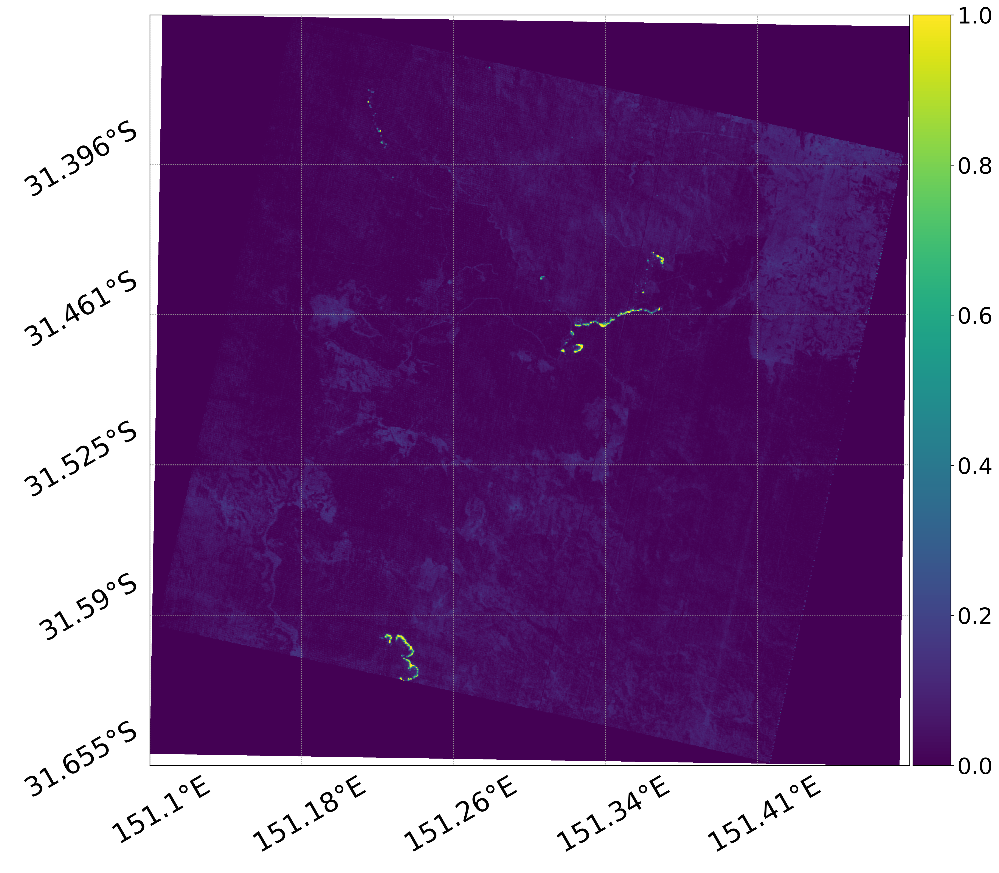

### South wildfire

In [8]:
rangeX = range(940,1080)
rangeY = range(300,500)

pixels_db = create_database_for_final_map(rangeX, rangeY)
pixels_in_south_map = prepare_map_as_tuple(pixels_db)

output = open('pixels_in_south_map.pkl', 'wb')
pickle.dump(pixels_in_south_map, output)
output.close()

100%|███████████████████████████████████████████████████████████████████████████████| 140/140 [00:00<00:00, 229.04it/s]


C:\Users\dario\anaconda3\lib\site-packages\ipykernel_launcher.py:20: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


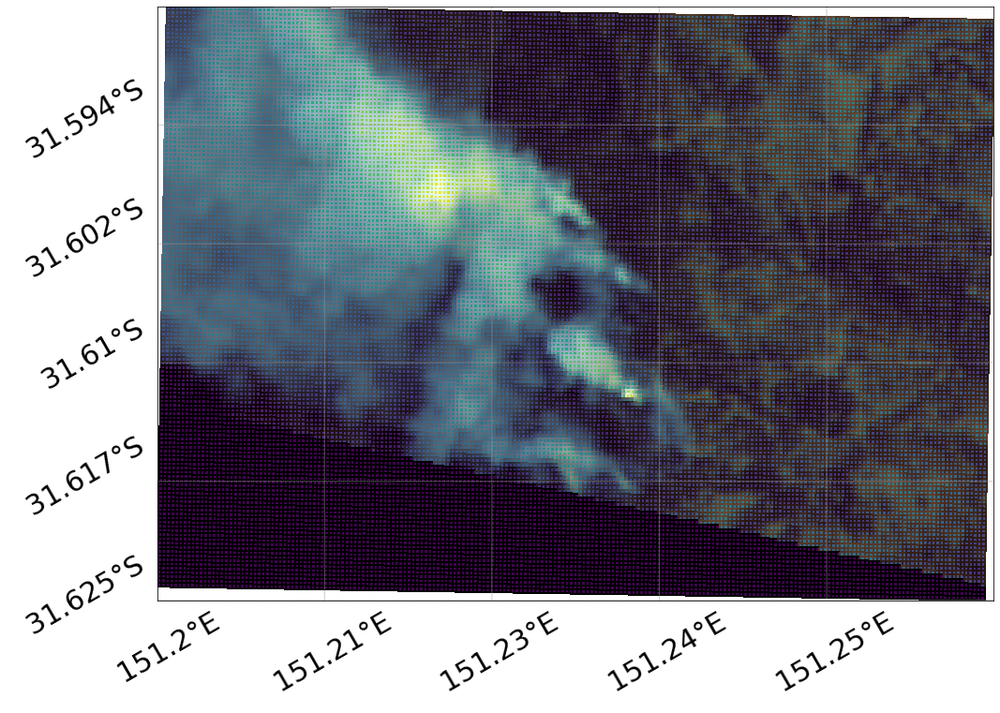

In [9]:
# initialize the figure
fig,ax = plt.subplots(figsize = (16,16))

# Define lats and longs for the figure
deltaX = slice(940,1080)
deltaY = slice(300,500)
    
lons_fig = [np.min(lon[deltaX,deltaY]), np.max(lon[deltaX,deltaY])]
lats_fig = [np.min(lat[deltaX,deltaY]), np.max(lat[deltaX,deltaY])]
# lons_fig = [151.2, 151.26]
# lats_fig = [-31.629,-31.590]
lat_0 = np.mean(lats_fig)
lon_0 = np.mean(lons_fig)

# initialize the map
map_kwargs = dict(projection='merc', resolution='l',
                  llcrnrlat=np.min(lats_fig), urcrnrlat=np.max(lats_fig),
                  llcrnrlon=np.min(lons_fig), urcrnrlon=np.max(lons_fig),
                  lat_0=lat_0, lon_0=lon_0)
m = Basemap(**map_kwargs)

# drawing parallels and meridians
m.drawparallels(np.arange(np.min(lats_fig),np.max(lats_fig),0.2*(np.max(lats_fig)-np.min(lats_fig))),labels=[1,0,0,0],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')
m.drawmeridians(np.arange(np.min(lons_fig),np.max(lons_fig),0.2*(np.max(lons_fig)-np.min(lons_fig))),labels=[0,0,0,1],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')


# drawing the PRISMA image
mesh_rgb = A[deltaX, deltaY.start:deltaY.stop-1, :]/np.max(A[deltaX, deltaY, :])
colorTuple = mesh_rgb.reshape((mesh_rgb.shape[0] * mesh_rgb.shape[1]), 3)
alpha = 1.0
colorTuple = np.insert(colorTuple,3,alpha,axis=1)

## What you put in for the image doesn't matter because of the color mapping
m.pcolormesh(lon[deltaX,deltaY], lat[deltaX,deltaY], A[deltaX,deltaY,0], latlon=True, color=colorTuple)

# Labels on axes
#plt.xlabel('Longitude (degree)', labelpad=80, fontsize=16)
#plt.ylabel('Latitude (degree)', labelpad=100, fontsize=16)

plt.show()


### North-east wildfire

In [10]:
rangeX = range(350,550)
rangeY = range(600,850)
        
pixels_db = create_database_for_final_map(rangeX, rangeY)
pixels_in_north_map = prepare_map_as_tuple(pixels_db)

output = open('pixels_in_north_map.pkl', 'wb')
pickle.dump(pixels_in_north_map, output)
output.close()

100%|███████████████████████████████████████████████████████████████████████████████| 200/200 [00:00<00:00, 203.13it/s]


C:\Users\dario\anaconda3\lib\site-packages\ipykernel_launcher.py:20: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


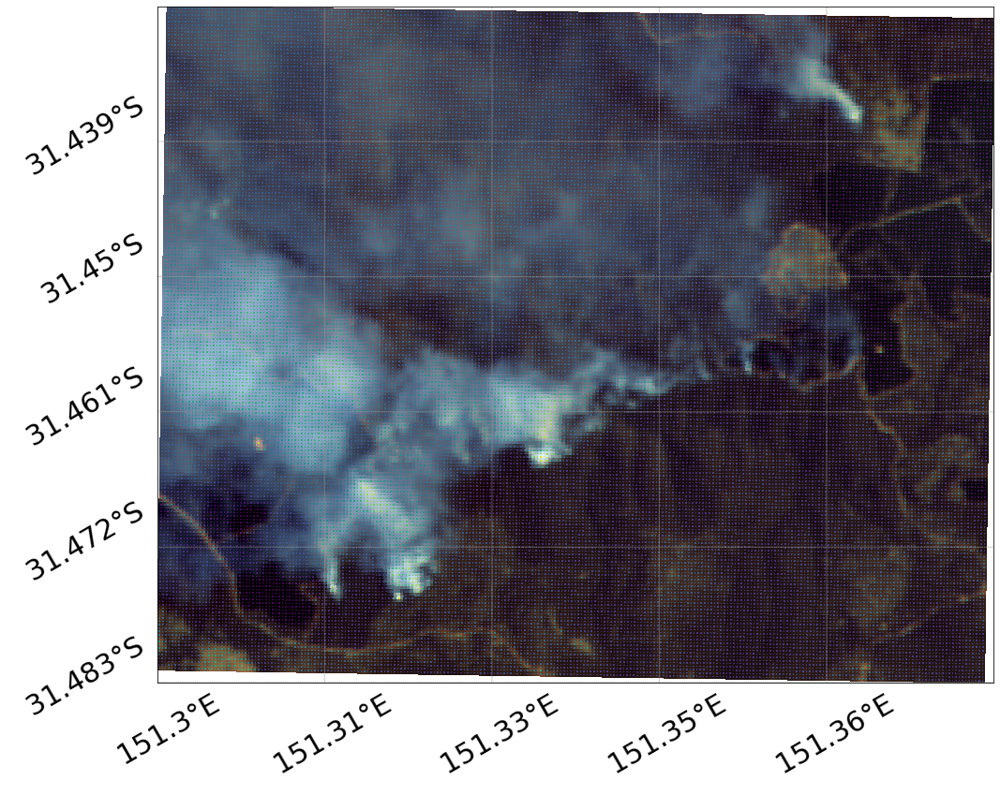

In [11]:
# initialize the figure
fig,ax = plt.subplots(figsize = (16,16))

# Define lats and longs for the figure
deltaX = slice(350,550)
deltaY = slice(600,850)
    
lons_fig = [np.min(lon[deltaX,deltaY]), np.max(lon[deltaX,deltaY])]
lats_fig = [np.min(lat[deltaX,deltaY]), np.max(lat[deltaX,deltaY])]
# lons_fig = [151.2, 151.26]
# lats_fig = [-31.629,-31.590]
lat_0 = np.mean(lats_fig)
lon_0 = np.mean(lons_fig)

# initialize the map
map_kwargs = dict(projection='merc', resolution='l',
                  llcrnrlat=np.min(lats_fig), urcrnrlat=np.max(lats_fig),
                  llcrnrlon=np.min(lons_fig), urcrnrlon=np.max(lons_fig),
                  lat_0=lat_0, lon_0=lon_0)
m = Basemap(**map_kwargs)

# drawing parallels and meridians
m.drawparallels(np.arange(np.min(lats_fig),np.max(lats_fig),0.2*(np.max(lats_fig)-np.min(lats_fig))),labels=[1,0,0,0],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')
m.drawmeridians(np.arange(np.min(lons_fig),np.max(lons_fig),0.2*(np.max(lons_fig)-np.min(lons_fig))),labels=[0,0,0,1],
                color=[0.6,0.6,0.6], fontsize=30, rotation=30, fmt='%8.5g')


# drawing the PRISMA image
mesh_rgb = A[deltaX, deltaY.start:deltaY.stop-1, :]/np.max(A[deltaX, deltaY, :])
colorTuple = mesh_rgb.reshape((mesh_rgb.shape[0] * mesh_rgb.shape[1]), 3)
alpha = 1.0
colorTuple = np.insert(colorTuple,3,alpha,axis=1)

## What you put in for the image doesn't matter because of the color mapping
m.pcolormesh(lon[deltaX,deltaY], lat[deltaX,deltaY], A[deltaX,deltaY,0], latlon=True, color=colorTuple)

# Labels on axes
#plt.xlabel('Longitude (degree)', labelpad=80, fontsize=16)
#plt.ylabel('Latitude (degree)', labelpad=100, fontsize=16)

plt.show()


# <font color='blue'>1D-CNN model training</font> 

### Initialization of the GPU

In [12]:
seed(1)
tf.random.set_seed(2)

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            # tf.config.experimental.set_virtual_device_configuration(gpus[0],
            # [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1000)])
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


### Loading training data

* *Active fires* = class 0<br> 
* *Saturated fires* = class -1<br> 
* *Smoke* = class 1<br> 
* *Burned areas* = class 2<br> 
* *High vegetation, bushes and low vegetation* = class 3<br> 
* *Bare soil/road/anthropic* = class 4


In [13]:
keep_satur_label = False
main_folder = os.getcwd()

model_path = main_folder + sep + 'model_PRISMA.h5'  # name to be specified

folder_classes_Australia = main_folder + sep + 'Labelled_Data'
input_CSV_file1 = folder_classes_Australia + sep + 'Fire1-ClassesForClassification.csv'
input_CSV_file2 = folder_classes_Australia + sep + 'Fire2-ClassesForClassification.csv'

fire1_classes, fire1_points, skip_rows1 = eval_classes_and_points(input_CSV_file1, keep_satur_label)
fire2_classes, fire2_points, skip_rows2 = eval_classes_and_points(input_CSV_file2, keep_satur_label)

fire1points = pd.read_csv(input_CSV_file1, skiprows=skip_rows1)
fire2points = pd.read_csv(input_CSV_file2, skiprows=skip_rows2)

classes_array1 = get_classes_array(fire1_classes, fire1_points)
classes_array2 = get_classes_array(fire2_classes, fire2_points)

fire1points['class'] = np.array(classes_array1).astype('int')
fire2points['class'] = np.array(classes_array2).astype('int')

Training_dataset = fire2points

train, test = train_test_split(Training_dataset)

X_train, y_train0, y_train = get_items_and_labels(train)
X_test, y_test0, y_test = get_items_and_labels(test)

X_fire1, y_fire1_0, y_fire1 = get_items_and_labels(fire1points)

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
fire1_dataset = tf.data.Dataset.from_tensor_slices((X_fire1, y_fire1))

BATCH_SIZE = 5
SHUFFLE_BUFFER_SIZE = 100

train_batches = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_batches = test_dataset.batch(BATCH_SIZE)
fire1_val = fire1_dataset.batch(BATCH_SIZE)

L = len(X_train.iloc[0])

In [14]:
# Model construction
model = model_1D(dim=L, learn_rate=1e-4, lmbda=1e-5, drop=0.0, FL=3, n_filters=112,
                 init='he_normal')  # glorot_normal   he_normal

checkpoint = ModelCheckpoint(model_path, save_best_only=True, save_weights_only=True)
stop = EarlyStopping(verbose=1, patience=10)
cal = [checkpoint, stop]

# Initialization with previous weights
# model.load_weights('D:/Documenti_Lavoro/Craters_detection/da_francesco/moon_model_francesco.h5')

print('Fitting the model...')
results = model.fit(train_batches,
                    epochs=200,
                    callbacks=cal,
                    validation_data=test_batches,
                    shuffle='batch')    

Fitting the model...
Epoch 1/200
27/27 [==============================] - 5s 22ms/step - loss: 1.3614 - accuracy: 0.4373 - val_loss: 0.8043 - val_accuracy: 0.6429
Epoch 2/200
27/27 [==============================] - 0s 5ms/step - loss: 0.7335 - accuracy: 0.7338 - val_loss: 0.5999 - val_accuracy: 0.7679
Epoch 3/200
27/27 [==============================] - 0s 4ms/step - loss: 0.5806 - accuracy: 0.7600 - val_loss: 0.5043 - val_accuracy: 0.7679
Epoch 4/200
27/27 [==============================] - 0s 4ms/step - loss: 0.4048 - accuracy: 0.8088 - val_loss: 0.4453 - val_accuracy: 0.8036
Epoch 5/200
27/27 [==============================] - 0s 5ms/step - loss: 0.3332 - accuracy: 0.8709 - val_loss: 0.3954 - val_accuracy: 0.8214
Epoch 6/200
27/27 [==============================] - 0s 5ms/step - loss: 0.3008 - accuracy: 0.8846 - val_loss: 0.3538 - val_accuracy: 0.8750
Epoch 7/200
27/27 [==============================] - 0s 5ms/step - loss: 0.2961 - accuracy: 0.9665 - val_loss: 0.3182 - val_accuracy

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         9
           3       0.94      1.00      0.97        15
           4       1.00      0.92      0.96        12

    accuracy                           0.98        56
   macro avg       0.99      0.98      0.98        56
weighted avg       0.98      0.98      0.98        56

0.9821428571428571
[[17  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  0  9  0  0]
 [ 0  0  0 15  0]
 [ 0  0  0  1 11]]
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       1.00      1.00      1.00        11
           2       0.90      1.00      0.95         9
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00        10

    accuracy                           0.98        51
   macro avg       0.

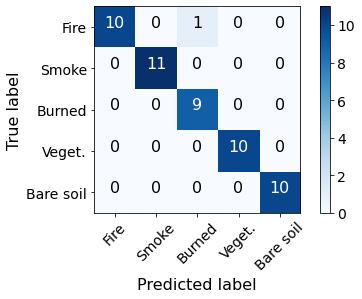

In [15]:
pred = model.predict(test_batches)
pred_classes_fire2 = np.argmax(pred, axis=1)
print(classification_report(y_test0, pred_classes_fire2))
print(accuracy_score(y_test0, pred_classes_fire2))
print(confusion_matrix(y_test0, pred_classes_fire2))

fire1 = model.predict(fire1_val)
pred_classes_fire1 = np.argmax(fire1, axis=1)
print(classification_report(y_fire1_0, pred_classes_fire1))
print(accuracy_score(y_fire1_0, pred_classes_fire1))
print(confusion_matrix(y_fire1_0, pred_classes_fire1))

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_fire1_0, pred_classes_fire1)
np.set_printoptions(precision=2)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=[ 'Fire','Smoke','Burned','Veget.','Bare soil'],
                      title='')
plt.show()

In [16]:
# IMPORTING MAPS FOR FINAL INFERENCES AND GENERATING FIGURES IN THE JUPYTER
# NOTEBOOK

loading_map = True

if loading_map:
    pkl_file = open('pixels_in_south_map.pkl', 'rb')
    data1 = pickle.load(pkl_file)
    pkl_file.close()
    X_map_south = data1[0]
    y_map_south = np_utils.to_categorical(data1[1]) #
else:
    X_map_south = pixels_in_south_map[0]
    y_map_south = np_utils.to_categorical(pixels_in_south_map[1]) 
    
map_south = tf.data.Dataset.from_tensor_slices((np.squeeze(X_map_south),y_map_south))
map_south = map_south.batch(BATCH_SIZE)

if loading_map:
    pkl_file = open('pixels_in_north_map.pkl', 'rb')
    data1 = pickle.load(pkl_file)
    pkl_file.close()
    X_map_north_east = data1[0]
    y_map_north_east = np_utils.to_categorical(data1[1]) #
else:
    X_map_north_east = pixels_in_north_map[0]
    y_map_north_east = np_utils.to_categorical(pixels_in_north_map[1]) #
    
map_north_east = tf.data.Dataset.from_tensor_slices((np.squeeze(X_map_north_east),y_map_north_east))
map_north_east = map_north_east.batch(BATCH_SIZE) 

print('*******************************************')
print('predicting 1...')
print('*******************************************')
pred_map_south = model.predict(map_south,verbose=1)
pred_classes_south = np.argmax(pred_map_south, axis=1)

print('*******************************************')
print('predicting 2...')
print('*******************************************')
pred_map_north_east = model.predict(map_north_east,verbose=1)
pred_classes_north = np.argmax(pred_map_north_east, axis=1)

*******************************************
predicting 1...
*******************************************
5600/5600 [==============================] - 9s 2ms/step
*******************************************
predicting 2...
*******************************************
10000/10000 [==============================] - 14s 1ms/step


100%|███████████████████████████████████████████████████████████████████████████████| 140/140 [00:00<00:00, 176.21it/s]


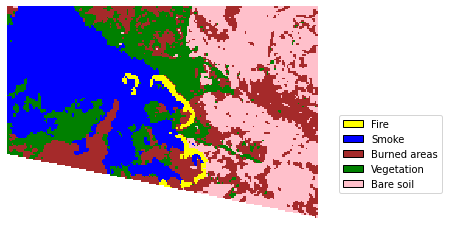

In [17]:
#ref_path = 'D:\\Documenti_Lavoro\\ASI-ESA POSTDOC\\PRISMA\\fire\\model\\data\\'
#data = np.load(ref_path + 'PRISMA_fire_predictions_map_south_new.npy')
data1 = pred_classes_south.reshape(140,200)
colors = ['yellow', 'blue', 'brown', 'green', 'pink', 'white']
legend_strings = (['Fire', 'Smoke', 'Burned areas', 'Vegetation', 'Bare soil'])

rangeX = range(940,1080)
rangeY = range(300,500)
for i in tqdm(rangeX):
    for j in rangeY:
        if sum(DATA_CUBE[i,:,j]) == 0:
            data1[i-940,j-300] = 5
            
cmap = mpl.colors.ListedColormap(colors)
plt.imshow(data1, interpolation='none', cmap=cmap)
plt.axis('off')

# create a patch (proxy artist) for every color 
patches = [ mpatches.Patch(facecolor=colors[i],edgecolor='black', label=legend_strings[i]) for i in range(5)]
# put those patched as legend-handles into the legend
plt.legend(handles=patches, bbox_to_anchor=(1.4, 0.5), borderaxespad=0. ) #bbox_to_anchor=(0.412, 1)
plt.show()

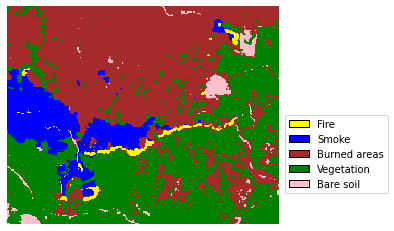

In [18]:
data1 = pred_classes_north.reshape(200,250)
colors = ['yellow', 'blue', 'brown', 'green', 'pink']

cmap = mpl.colors.ListedColormap(colors)
plt.imshow(data1, interpolation='none', cmap=cmap)
plt.axis('off')
# create a patch (proxy artist) for every color 
patches = [ mpatches.Patch(facecolor=colors[i],edgecolor='black', label=legend_strings[i]) for i in range(5)]
# put those patched as legend-handles into the legend
plt.legend(handles=patches, bbox_to_anchor=(1.4, 0.5), borderaxespad=0. ) #bbox_to_anchor=(0.412, 1)

plt.show()
